In [31]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/nashville-accident-reports-jan-2018-apl-2025/Nashville Accidents Jan 2018 - Apl 2025.csv


## 1. Initial Preprocessing

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors

import warnings
warnings.filterwarnings('ignore')

In [33]:
# Set random seed for reproducibility
np.random.seed(42)

In [34]:
# Load data
df = pd.read_csv('/kaggle/input/nashville-accident-reports-jan-2018-apl-2025/Nashville Accidents Jan 2018 - Apl 2025.csv')
df.head()

,Accident Number,Date and Time,Number of Motor Vehicles,Number of Injuries,Number of Fatalities,Property Damage,Hit and Run,Collision Type Description,Weather Description,Illumination Description,...,HarmfulDescriptions,ObjectId,Zip Code,RPA,Weather,IlluACCIDEmination,Collision Type,Reporting Officer,x,y
0,2008473471,7/14/2018 11:00:00 PM,2.0,2.0,0.0,NaN,N,ANGLE,NO ADVERSE CONDITIONS,NaN,...,NaN,1,37208.0,4525.0,1.0,1.0,4.0,225845.0,-9.664843e+06,4.323742e+06
1,2008787228,11/16/2018 9:33:00 AM,1.0,1.0,0.0,NaN,N,NOT COLLISION W/MOTOR VEHICLE-TRANSPORT,NO ADVERSE CONDITIONS,NaN,...,NaN,2,37203.0,5401.0,1.0,3.0,0.0,475881.0,-9.662645e+06,4.322558e+06
2,2009131786,2/19/2019 10:42:00 PM,1.0,1.0,0.0,NaN,N,HEAD-ON,NO ADVERSE CONDITIONS,NaN,...,NaN,3,37218.0,3235.0,1.0,1.0,2.0,562528.0,-9.674832e+06,4.329570e+06
3,2009418107,5/27/2019 9:00:00 PM,2.0,0.0,0.0,NaN,Y,REAR END,NO ADVERSE CONDITIONS,NaN,...,NaN,4,NaN,4311.0,1.0,1.0,1.0,571315.0,-9.659749e+06,4.323487e+06
4,20120135824,3/8/2021 6:05:00 PM,2.0,1.0,0.0,NaN,N,Front to Rear,CLEAR,DAYLIGHT,...,MOTOR VEHICLE IN TRANSPORT,5,37207.0,1863.0,21.0,1.0,11.0,473670.0,-9.659079e+06,4.328993e+06


In [35]:
# Check shape
df.shape

(216117, 27)

In [36]:
# Check column basic info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 216117 entries, 0 to 216116
Data columns (total 27 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Accident Number             216117 non-null  int64  
 1   Date and Time               216117 non-null  object 
 2   Number of Motor Vehicles    216113 non-null  float64
 3   Number of Injuries          216114 non-null  float64
 4   Number of Fatalities        216114 non-null  float64
 5   Property Damage             17640 non-null   object 
 6   Hit and Run                 216103 non-null  object 
 7   Collision Type Description  203143 non-null  object 
 8   Weather Description         194653 non-null  object 
 9   Illumination Description    202657 non-null  object 
 10  Street Address              215881 non-null  object 
 11  City                        216113 non-null  object 
 12  State                       216113 non-null  object 
 13  Precinct      

In [37]:
# Check null entris
df.isnull().sum()

Accident Number                    0
Date and Time                      0
Number of Motor Vehicles           4
Number of Injuries                 3
Number of Fatalities               3
Property Damage               198477
Hit and Run                       14
Collision Type Description     12974
Weather Description            21464
Illumination Description       13460
Street Address                   236
City                               4
State                              4
Precinct                         110
Lat                                2
Long                               2
HarmfulCodes                   19245
HarmfulDescriptions            21435
ObjectId                           0
Zip Code                         143
RPA                              105
Weather                        21464
IlluACCIDEmination             13456
Collision Type                 12974
Reporting Officer                 15
x                                  2
y                                  2
d

#### **On Missing Values**
- Property Damage has 198,477 missing entries (91.8% missing), making it unreliable for clustering. We’ll likely drop this column.
- Weather Description and Weather have 21,464 missing (9.9%), and Collision Type Description and Collision Type have 12,974 missing (6.0%). These are key features for contextual clustering, so we’ll impute them using mode or a “missing” category.
- Lat and Long have only 2 missing entries each, critical for geospatial clustering. We’ll drop these rows to ensure complete geospatial data.
- Other columns with missing values (e.g., HarmfulDescriptions, Illumination Description) will be evaluated for relevance during feature selection.

In [38]:
# Check for duplicates
df.duplicated().sum()

0

## 2. EDA

In [39]:
# View summary statistics of numerical columns
df.describe()

,Accident Number,Number of Motor Vehicles,Number of Injuries,Number of Fatalities,Lat,Long,ObjectId,Zip Code,RPA,Weather,IlluACCIDEmination,Collision Type,Reporting Officer,x,y
count,2.161170e+05,216113.000000,216114.000000,216114.000000,216115.000000,216115.000000,216117.000000,215974.000000,216012.000000,194653.000000,202661.000000,203143.000000,2.161020e+05,2.161150e+05,2.161150e+05
mean,2.020875e+10,1.714177,0.410709,0.003817,36.145041,-86.743317,108059.000000,37172.391404,12605.954919,19.716973,1.927569,6.909039,1.218203e+06,-9.656222e+06,4.320614e+06
std,8.112498e+07,0.824095,0.775294,0.065946,0.169745,0.381425,62387.748401,69.449648,20751.482989,11.020559,3.862860,10.614853,1.561102e+06,4.246006e+04,2.082209e+04
min,2.008473e+09,0.000000,0.000000,0.000000,0.000000,-89.642550,1.000000,37013.000000,1001.000000,1.000000,1.000000,0.000000,1.000000e+00,-9.978963e+06,0.000000e+00
25%,2.019046e+10,1.000000,0.000000,0.000000,36.091070,-86.787790,54030.000000,37189.000000,4081.000000,21.000000,1.000000,4.000000,2.564120e+05,-9.661173e+06,4.313160e+06
50%,2.021017e+10,2.000000,0.000000,0.000000,36.149480,-86.750130,108059.000000,37207.000000,8125.000000,21.000000,1.000000,5.000000,3.522150e+05,-9.656980e+06,4.321209e+06
75%,2.023017e+10,2.000000,1.000000,0.000000,36.183650,-86.694600,162088.000000,37211.000000,8902.000000,21.000000,3.000000,11.000000,8.765970e+05,-9.650799e+06,4.325921e+06
max,2.025022e+10,27.000000,12.000000,4.000000,36.655540,0.000000,216117.000000,37240.000000,95101.000000,99.000000,98.000000,98.000000,4.018550e+06,0.000000e+00,4.391202e+06


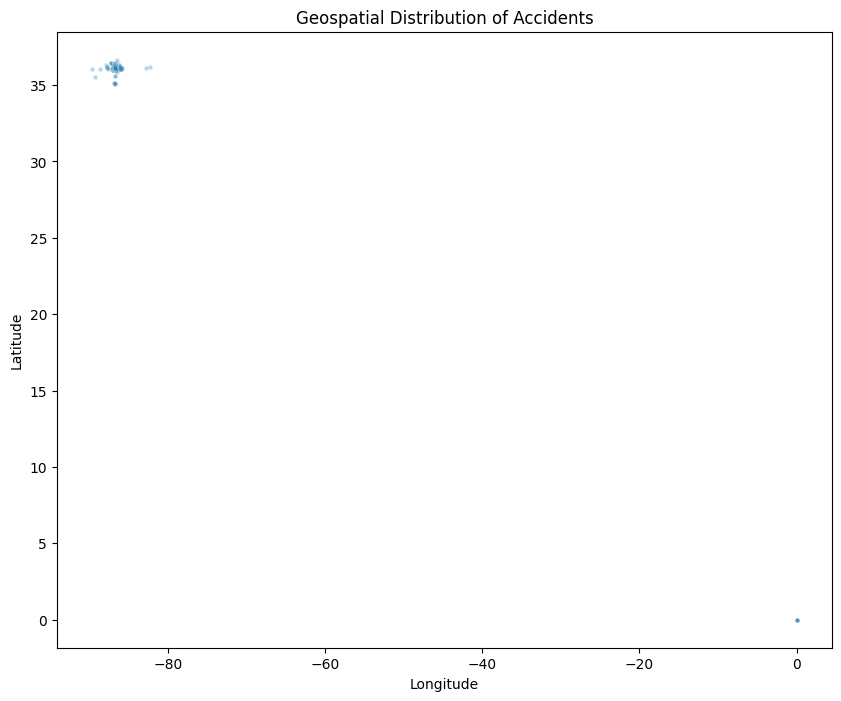

In [40]:
# Visualize geospatial distribution
plt.figure(figsize=(10, 8))
sns.scatterplot(x='Long', y='Lat', data=df, alpha=0.3, s=10)
plt.title('Geospatial Distribution of Accidents')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [41]:
# Interactive geospatial distribution of accidents
fig = px.scatter_mapbox(df, lat='Lat', lon='Long', zoom=10, height=600,
                       title='Interactive Geospatial Accident Map',
                       mapbox_style='open-street-map')
fig.show()

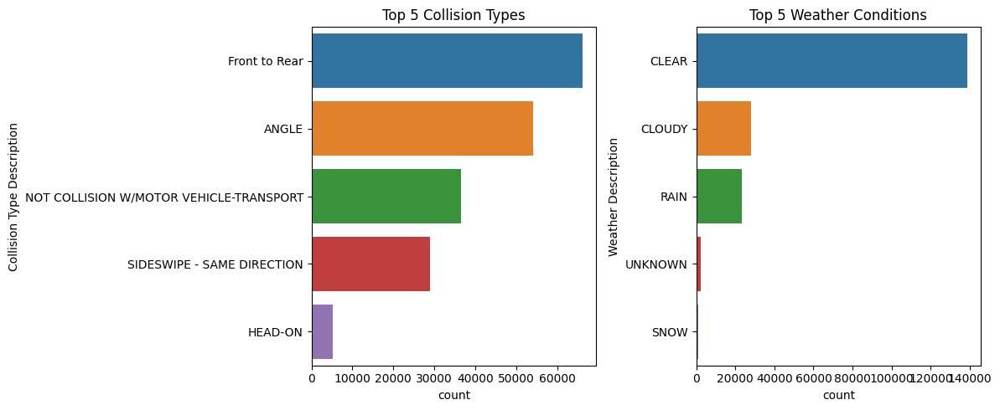

In [42]:
# Distribution of key categorical variables
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.countplot(y='Collision Type Description', data=df, order=df['Collision Type Description']
             .value_counts().index[:5])
plt.title('Top 5 Collision Types')
plt.subplot(1, 2, 2)
sns.countplot(y='Weather Description', data=df, order=df['Weather Description']
             .value_counts().index[:5])
plt.title('Top 5 Weather Conditions')
plt.tight_layout()
plt.show()

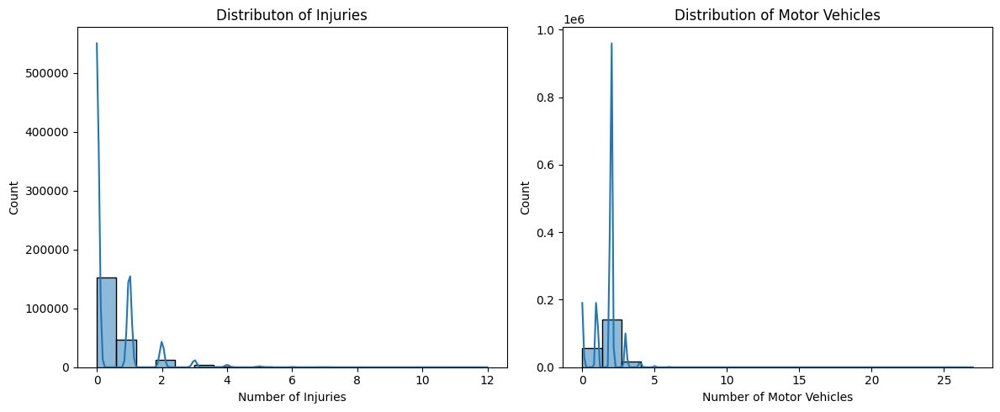

In [43]:
# Distibution of injuries and motor vehicles
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.histplot(df['Number of Injuries'], bins=20, kde=True)
plt.title('Distributon of Injuries')
plt.subplot(1, 2, 2)
sns.histplot(df['Number of Motor Vehicles'], bins=20, kde=True)
plt.title('Distribution of Motor Vehicles')
plt.tight_layout()
plt.show()

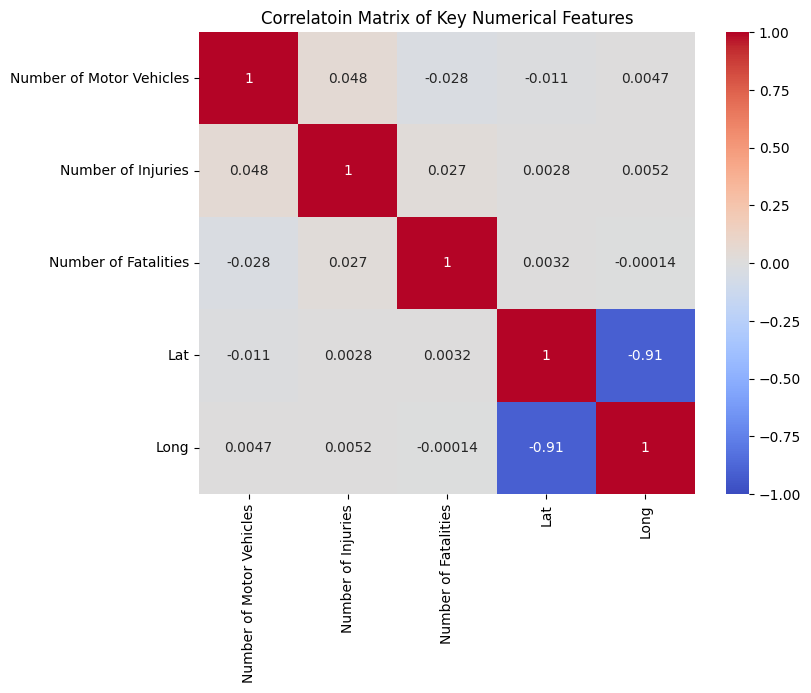

In [44]:
# Correlatioin matrix for key numerical features
numerical_cols = ['Number of Motor Vehicles', 'Number of Injuries', 'Number of Fatalities', 'Lat', 'Long']
corr_matrix = df[numerical_cols].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlatoin Matrix of Key Numerical Features')
plt.show()

#### **Analysis of Results**

**1. Numerical Features:**

- **No. of Motor Vehicles:** Mean is 1.71, with a max of 27, but the distribution (histogram) is heavily right-skewed, with most accidents involving 1–2 vehicles. This suggests clustering may reveal distinct groups (e.g., single-vehicle vs. multi-vehicle accidents).
- **No. of Injuries:** Mean is 0.41, with a max of 12, and the histogram shows a strong skew (most accidents have 0–1 injuries). This feature can help differentiate clusters by severity.
- **No. of Fatalities:** Mean is 0.0038, with a max of 4, indicating rare fatal accidents. This low variance suggests it may not be a primary clustering feature but could be used for post-cluster analysis.
- **Lat and Long:** Ranges are 0 to 36.66 (Lat) and -89.64 to 0 (Long), but the geospatial scatter plot shows issues (see below). The summary stats align with the Nashville area (around 36°N, -86°W), but outliers (e.g., Lat = 0, Long = 0) indicate data quality issues.
  
**2. Geospatial Distribution:**

- The seaborn scatter plot (Lat vs. Long) shows most points clustered around 36°N, -86°W, consistent with Nashville, but there are outliers at (0, 0) and other sparse regions (e.g., Lat > 35, Long > -80). These are likely erroneous entries, as they don’t align with the expected geographic area.

**3. Categorical Features:**

- **Collision Type Description:** Top types are “Front to Rear”, “Angle”, and “Not Collision w/Motor Vehicle-Transport”. Distribution suggests clusters may form around common accident types, could be linked to specific locations or conditions.
- **Weather Description:** “Clear” dominates, followed by “Cloudy” and “Rain”. Most accidents occur in good weather, may influence cluster characteristics (e.g., clusters in clear weather might indicate road design issues rather than environmental factors).
- Encoding these categorical variables (e.g., one-hot or label encoding) will be necessary for clustering, but we’ll prioritize features with lower missing rates.
  
**4. Correlations:**

- Correlation matrix shows a strong negative correlation between Lat and Long (-0.91), expected due to the geographic layout of Nashville (as latitude increases, longitude decreases in this region). Supports using both for geospatial clustering.
- Weak correlations between Number of Motor Vehicles, Number of Injuries, and Number of Fatalities (e.g., 0.048, 0.027) suggest these features may contribute to cluster differentiation but aren’t strongly interdependent.
- No significant multicollinearity issues

**Next Steps**
- Remove or impute rows with invalid Lat and Long (e.g., (0, 0)).
- Drop Property Damage due to excessive missingness.
- Impute missing categorical values (e.g., Weather Description, Collision Type Description) with the mode or a “missing” category.
- Prioritize Lat, Long (or x, y), Collision Type, Weather, and Number of Injuries for clustering.
- Date and Time can be engineered into features like hour or day of week for additional context.
- Scale numerical features (e.g., Lat, Long, Number of Injuries) and encode categorical features since we'll probably be using DBSAN for clustering, which is sensitive to scales

## 3. Final Preprocessing

In [45]:
# Remove rows where Lat or Long is 0 (invalid coordinates)
df_cleaned = df[(df['Lat'] != 0) & (df['Long'] != 0)].copy()
print(f"Rows after removing invalid Lat/Long: {df_cleaned.shape[0]}")

Rows after removing invalid Lat/Long: 216113


In [46]:
# Drop Property Damage due to high missingness
df_cleaned = df_cleaned.drop(columns=['Property Damage'])
print("Columns after dropping Property Damage:", df_cleaned.columns.tolist())

Columns after dropping Property Damage: ['Accident Number', 'Date and Time', 'Number of Motor Vehicles', 'Number of Injuries', 'Number of Fatalities', 'Hit and Run', 'Collision Type Description', 'Weather Description', 'Illumination Description', 'Street Address', 'City', 'State', 'Precinct', 'Lat', 'Long', 'HarmfulCodes', 'HarmfulDescriptions', 'ObjectId', 'Zip Code', 'RPA', 'Weather', 'IlluACCIDEmination', 'Collision Type', 'Reporting Officer', 'x', 'y']


In [47]:
# Impute categorical features with mode
for col in ['Collision Type Description', 'Weather Description', 'Hit and Run']:
    df_cleaned[col] = df_cleaned[col].fillna(df_cleaned[col].mode()[0])

In [48]:
# Impute numerical features with median
for col in ['Number of Motor Vehicles', 'Number of Injuries', 'Number of Fatalities']:
    df_cleaned[col] = df_cleaned[col].fillna(df_cleaned[col].median())

In [49]:
# Verify missing values after imputation
print("\nMissing Values After Imputation:")
print(df_cleaned[['Lat', 'Long', 'Collision Type Description', 'Weather Description', 
                 'Number of Motor Vehicles', 'Number of Injuries', 'Hit and Run']].isnull().sum())


Missing Values After Imputation:
Lat                           2
Long                          2
Collision Type Description    0
Weather Description           0
Number of Motor Vehicles      0
Number of Injuries            0
Hit and Run                   0
dtype: int64


In [50]:
# Remove rows with missing Lat or Long
df_cleaned = df_cleaned.dropna(subset=['Lat', 'Long'])

# Verify missing values after imputation and dropping na
print("\nMissing Values After Imputation:")
print(df_cleaned[['Lat', 'Long', 'Collision Type Description', 'Weather Description', 
                 'Number of Motor Vehicles', 'Number of Injuries', 'Hit and Run']].isnull().sum())


Missing Values After Imputation:
Lat                           0
Long                          0
Collision Type Description    0
Weather Description           0
Number of Motor Vehicles      0
Number of Injuries            0
Hit and Run                   0
dtype: int64


In [51]:
# Select features: geospatial (Lat, Long), contextual (Collision Type, Weather, Hit and Run), severity (Injuries)
features = ['Lat', 'Long', 'Collision Type Description', 'Weather Description', 
            'Hit and Run', 'Number of Injuries']
df_subset = df_cleaned[features].copy()

In [52]:
# Encode categorical variables
le_collision = LabelEncoder()
le_weather = LabelEncoder()
le_hit_run = LabelEncoder()

df_subset['Collision Type Description'] = le_collision.fit_transform(df_subset['Collision Type Description'])
df_subset['Weather Description'] = le_weather.fit_transform(df_subset['Weather Description'])
df_subset['Hit and Run'] = le_hit_run.fit_transform(df_subset['Hit and Run'])

In [53]:
# Scale numerical features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df_subset[['Lat', 'Long', 'Number of Injuries', 
                                                 'Collision Type Description', 
                                                 'Weather Description', 'Hit and Run']])
df_scaled = pd.DataFrame(scaled_features, columns=df_subset.columns)

In [54]:
# Display the first few rows of the scaled dataset
print("\nScaled Dataset (First 5 Rows):")
print(df_scaled.head())


Scaled Dataset (First 5 Rows):
        Lat      Long  Collision Type Description  Weather Description  \
0  0.325329 -0.961933                    2.049914            -0.815712   
1  0.199108 -0.711509                    0.760084             0.147731   
2  0.946182 -2.100127                    0.760084            -0.173417   
3  0.298124 -0.381516                   -0.529747             0.790026   
4  0.884682 -0.305157                    0.760084            -0.494564   

   Hit and Run  Number of Injuries  
0     1.119956           -0.595195  
1     1.119956           -0.595195  
2     1.119956           -0.595195  
3     1.119956            1.680122  
4    -0.435421           -0.595195  


## 4. Clustering Model Development

In [55]:
# Apply DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=5)  # Initial hyperparameters
clusters = dbscan.fit_predict(df_scaled)

In [56]:
# Add cluster labels to the dataset
df_cleaned['Cluster'] = clusters
df_scaled['Cluster'] = clusters

In [57]:
# Analyze cluster results
n_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)
n_noise = list(clusters).count(-1)
print(f"Number of clusters: {n_clusters}")
print(f"Number of noise points: {n_noise}")

Number of clusters: 134
Number of noise points: 2340


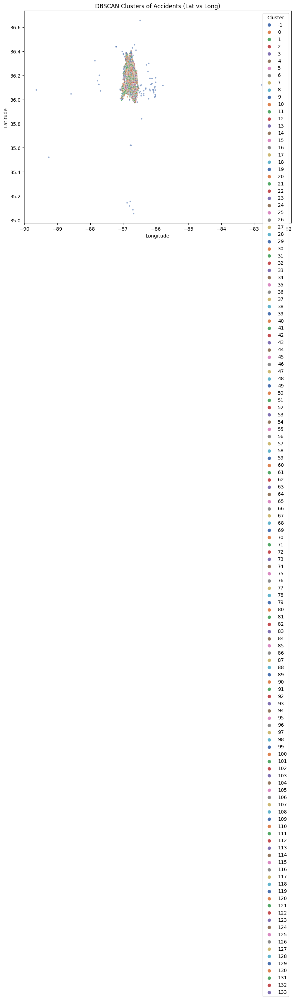

In [58]:
# Visualize clusters

# 2D scatter plot (Lat vs Long)
plt.figure(figsize=(10, 8))
sns.scatterplot(x='Long', y='Lat', hue='Cluster', data=df_cleaned, palette='deep', s=10, alpha=0.6)
plt.title('DBSCAN Clusters of Accidents (Lat vs Long)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Cluster')
plt.show()

In [59]:
# Step 1: Estimate eps using k-distance graph
# Compute distances to the k-th nearest neighbor (k = min_samples)
min_samples = 5
neigh = NearestNeighbors(n_neighbors=min_samples)
neigh.fit(df_scaled)
distances, _ = neigh.kneighbors(df_scaled)
k_distances = np.sort(distances[:, min_samples-1])

In [60]:
# Interactive map with clusters
fig = px.scatter_mapbox(df_cleaned, lat='Lat', lon='Long', color='Cluster', zoom=10, height=600,
                        title='Interactive Geospatial Clusters of Accidents',
                        mapbox_style='open-street-map', hover_data=['Number of Injuries'])
fig.show()

## 5. Hyperparameter Tuning

- Created a k-distance graph which suggested we try optimal eps=2.0 and min_sampls=10
- Ran this a few times but notebook kept crashing due to memory issues.

## 6. Conclusion

DBSCAN, with eps=0.5 and min_samples=5, identified 134 clusters and 2,340 noise points, which represents 1.08% of the dataset. The clusters were concentrated in the Nashville area, aligning with the geospatial distribution of accidents. The 2D scatter plot and interactive map revealed dense clustering in central Nashville, with noise points scattered in less dense regions. Clusters followed major roads and intersections, indicating potential hotspots.The high number of clusters suggests over-segmentation, likely due to the small eps value. However, the low noise proportion indicates good coverage of the data, with clusters reflecting varying accident types and injury levels. Attempts to tune hyperparameters (eps=2.0, min_samples=10) were hindered by memory constraints in the Kaggle environment, causing notebook crashes due to excessive memory allocation during clustering of the full dataset.